In [1]:
import random
import os
import numpy as np
import math
import json
import torch
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.models import vgg19
from PIL import Image
from torchvision.utils import save_image, make_grid
import argparse
import itertools
import sys
import cv2
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt

In [2]:
from PIL import Image
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Update your paths
IMG_TRAIN_PATH = '../input/sr-3000/SR-3000/HR/train'
IMG_TEST_PATH = '../input/sr-3000/SR-3000/HR/test'
IMG_VALID_PATH = '../input/sr-3000/SR-3000/HR/val'

# Ensure directories exist
os.makedirs("images", exist_ok=True)
os.makedirs("saved_models", exist_ok=True)

# Define Options class
class Options:
    epoch = 0 
    n_epochs = 101
    dataset_name = "sr-sat-img" 
    batch_size = 32
    lr = 0.0002 
    b1 = 0.5 
    b2 = 0.999 
    decay_epoch = 100 
    n_cpu = 8 
    hr_height = 256 
    hr_width = 256 
    channels = 3 
    sample_interval = 500 
    checkpoint_interval = 10

opt = Options()

# Normalization parameters for pre-trained PyTorch models
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

class ImageDataset(Dataset):
    def __init__(self, filename_list, hr_shape):
        hr_height, hr_width = hr_shape
        self.lr_transform = transforms.Compose([
            transforms.Resize((hr_height // 4, hr_height // 4), Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])
        self.hr_transform = transforms.Compose([
            transforms.Resize((hr_height, hr_width), Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize(mean, std),
        ])
        self.files = filename_list

    def __getitem__(self, index):
        img = Image.open(self.files[index % len(self.files)])
        if img.mode != 'RGB':
            img = img.convert('RGB')
        img_lr = self.lr_transform(img)
        img_hr = self.hr_transform(img)
        return {"lr": img_lr, "hr": img_hr}

    def __len__(self):
        return len(self.files)

hr_shape = (opt.hr_height, opt.hr_width)

# Create datasets
train_filenames = [os.path.join(IMG_TRAIN_PATH, filename) for filename in os.listdir(IMG_TRAIN_PATH)]
test_filenames = [os.path.join(IMG_TEST_PATH, filename) for filename in os.listdir(IMG_TEST_PATH)]
valid_filenames = [os.path.join(IMG_VALID_PATH, filename) for filename in os.listdir(IMG_VALID_PATH)]

train_dataset = ImageDataset(train_filenames, hr_shape=hr_shape)
test_dataset = ImageDataset(test_filenames, hr_shape=hr_shape)
valid_dataset = ImageDataset(valid_filenames, hr_shape=hr_shape)

# Create data loaders
train_loader = DataLoader(train_dataset,
                          batch_size=opt.batch_size,
                          shuffle=True,
                          num_workers=opt.n_cpu)

test_loader = DataLoader(test_dataset,
                         batch_size=opt.batch_size,
                         shuffle=False,
                         num_workers=opt.n_cpu)

valid_loader = DataLoader(valid_dataset,
                          batch_size=opt.batch_size,
                          shuffle=False,
                          num_workers=opt.n_cpu)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


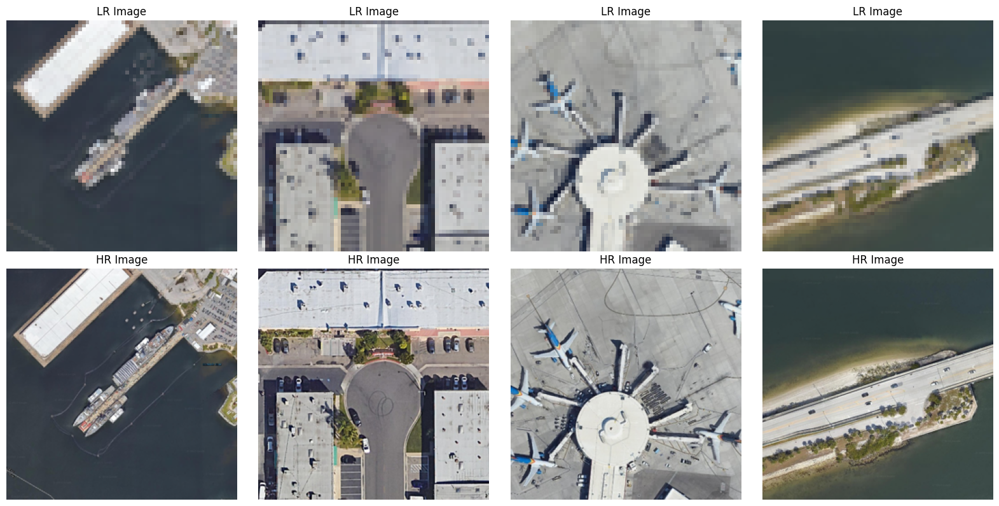

In [3]:
import matplotlib.pyplot as plt

# Define a function to unnormalize the image
def unnormalize(image, mean, std):
    """
    Unnormalize a tensor image with mean and standard deviation.
    """
    for t, m, s in zip(image, mean, std):
        t.mul_(s).add_(m)
    return image

# Get a batch of LR and HR images
for batch in train_loader:
    lr_images, hr_images = batch["lr"], batch["hr"]
    break  # break to just get one batch

# Plot LR and HR images
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))

for i in range(4):
    lr_image = unnormalize(lr_images[i].cpu(), mean, std).permute(1, 2, 0)
    hr_image = unnormalize(hr_images[i].cpu(), mean, std).permute(1, 2, 0)

    axes[0, i].imshow(lr_image)
    axes[0, i].set_title('LR Image')
    axes[0, i].axis('off')

    axes[1, i].imshow(hr_image)
    axes[1, i].set_title('HR Image')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [4]:
# Size of LR images
print("LR image size:", (opt.channels, opt.hr_height // 4, opt.hr_width // 4))

# Size of HR images
print("HR image size:", (opt.channels, opt.hr_height, opt.hr_width))

# Size of generated images
# Assuming the generator outputs images of the same size as HR images
print("Generated image size:", (opt.channels, opt.hr_height, opt.hr_width))

LR image size: (3, 64, 64)
HR image size: (3, 256, 256)
Generated image size: (3, 256, 256)


In [5]:
#feature extractor
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        vgg19_model = vgg19(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(vgg19_model.features.children())[:18])
    
    def forward(self, img):
        return self.feature_extractor(img)

#Residual block
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
            nn.PReLU(),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
        )

    def forward(self, x):
        return x + self.conv_block(x)

#Generator
class GeneratorResNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_residual_blocks=16):
        super(GeneratorResNet, self).__init__()

        # First layer
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels, 64, kernel_size=9, stride=1, padding=4), nn.PReLU())

        # Residual blocks
        res_blocks = []
        for _ in range(n_residual_blocks):
            res_blocks.append(ResidualBlock(64))
        self.res_blocks = nn.Sequential(*res_blocks)

        # Second conv layer post residual blocks
        self.conv2 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64, 0.8))

        # Upsampling layers
        upsampling = []
        for out_features in range(2):
            upsampling += [
                # nn.Upsample(scale_factor=2),
                nn.Conv2d(64, 256, 3, 1, 1),
                nn.BatchNorm2d(256),
                nn.PixelShuffle(upscale_factor=2),
                nn.PReLU(),
            ]
        self.upsampling = nn.Sequential(*upsampling)

        # Final output layer
        self.conv3 = nn.Sequential(nn.Conv2d(64, out_channels, kernel_size=9, stride=1, padding=4), nn.Tanh())

    def forward(self, x):
        out1 = self.conv1(x)
        out = self.res_blocks(out1)
        out2 = self.conv2(out)
        out = torch.add(out1, out2)
        out = self.upsampling(out)
        out = self.conv3(out)
        return out

#Discriminator
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        self.input_shape = input_shape
        in_channels, in_height, in_width = self.input_shape
        patch_h, patch_w = int(in_height / 2 ** 4), int(in_width / 2 ** 4)
        self.output_shape = (1, patch_h, patch_w)

        def discriminator_block(in_filters, out_filters, first_block=False):
            layers = []
            layers.append(nn.Conv2d(in_filters, out_filters, kernel_size=3, stride=1, padding=1))
            if not first_block:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            layers.append(nn.Conv2d(out_filters, out_filters, kernel_size=3, stride=2, padding=1))
            layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        layers = []
        in_filters = in_channels
        for i, out_filters in enumerate([64, 128, 256, 512]):
            layers.extend(discriminator_block(in_filters, out_filters, first_block=(i == 0)))
            in_filters = out_filters

        layers.append(nn.Conv2d(out_filters, 1, kernel_size=3, stride=1, padding=1))

        self.model = nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

In [6]:
cuda = torch.cuda.is_available()

# Initialize generator and discriminator
generator = GeneratorResNet()
discriminator = Discriminator(input_shape=(opt.channels, *hr_shape))
feature_extractor = FeatureExtractor()

# Set feature extractor to inference mode
feature_extractor.eval()

# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_content = torch.nn.L1Loss()

# Move models and data to GPU if available
if cuda:
    generator = generator.cuda()
    discriminator = discriminator.cuda()
    feature_extractor = feature_extractor.cuda()
    criterion_GAN = criterion_GAN.cuda()
    criterion_content = criterion_content.cuda()
    generator = torch.nn.DataParallel(generator)
    discriminator = torch.nn.DataParallel(discriminator)
    feature_extractor = torch.nn.DataParallel(feature_extractor)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

# Define Tensor type based on GPU availability
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 171MB/s]


In [7]:
from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# #for using 1GPU 
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

stat_train = {'D_loss':[], 'G_loss':[], 'val_D_loss':[], 'val_G_loss':[], 'train_psnr':[], 'train_ssim':[], 'val_psnr':[], 'val_ssim':[]}

# Define the training loop
for epoch in range(opt.epoch, opt.n_epochs):
    print('-------------------------------------------------')
    #print(f"Epoch {epoch}/{opt.n_epochs}")
    D_loss_epoch = 0
    G_loss_epoch = 0
    val_D_loss_epoch = 0
    val_G_loss_epoch = 0
    train_psnr = 0
    train_ssim = 0
    val_psnr = 0
    val_ssim = 0

    # Training loop with tqdm
    for i, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch}/{opt.n_epochs}")):
        num_batches = len(train_loader)
        # Transfer batch to GPU if available
        imgs_lr = batch["lr"].to(device)
        imgs_hr = batch["hr"].to(device)

        # Adversarial ground truths
        
        #for using 1 GPU only
        #valid = torch.ones((imgs_lr.size(0), *discriminator.output_shape)).to(device)
        #fake = torch.zeros((imgs_lr.size(0), *discriminator.output_shape)).to(device) 
        
        #for using 2 GPU
        output_shape = discriminator(imgs_hr).shape[2:]
        valid = torch.ones((imgs_lr.size(0), *output_shape)).to(device)
        fake = torch.zeros((imgs_lr.size(0), *output_shape)).to(device)


        # Train Generators
        optimizer_G.zero_grad()

        # Generate a high resolution image from low resolution input
        gen_hr = generator(imgs_lr)

        # Adversarial loss
        loss_GAN = criterion_GAN(discriminator(gen_hr), valid)

        # Content loss
        gen_features = feature_extractor(gen_hr)
        real_features = feature_extractor(imgs_hr)
        loss_content = criterion_content(gen_features, real_features.detach())

        # Total loss
        loss_G = loss_content + 1e-3 * loss_GAN

        loss_G.backward()
        optimizer_G.step()

        # Train Discriminator
        optimizer_D.zero_grad()

        # Loss of real and fake images
        loss_real = criterion_GAN(discriminator(imgs_hr), valid)
        loss_fake = criterion_GAN(discriminator(gen_hr.detach()), fake)

        # Total loss
        loss_D = (loss_real + loss_fake) / 2

        loss_D.backward()
        optimizer_D.step()

        D_loss_epoch += loss_D.item()
        G_loss_epoch += loss_G.item()

        # Calculate PSNR and SSIM
        gen_hr = gen_hr.cpu().detach().numpy()
        imgs_hr = imgs_hr.cpu().detach().numpy()
        train_psnr += peak_signal_noise_ratio(imgs_hr, gen_hr, data_range=1.0)
        train_ssim += structural_similarity(imgs_hr, gen_hr, win_size=min(imgs_hr.shape[1], imgs_hr.shape[2], 11), data_range=1.0, multichannel=True)

    train_psnr /= num_batches
    train_ssim /= num_batches

    # Validation loop
    with torch.no_grad():
        for j, valid_batch in enumerate(valid_loader):
            # Transfer batch to GPU if available
            imgs_lr_val = valid_batch["lr"].to(device)
            imgs_hr_val = valid_batch["hr"].to(device)

            # Validation loss calculation for Discriminator
            val_loss_real = criterion_GAN(discriminator(imgs_hr_val), valid)
            val_loss_fake = criterion_GAN(discriminator(generator(imgs_lr_val).detach()), fake)
            val_loss_D = (val_loss_real + val_loss_fake) / 2
            val_D_loss_epoch += val_loss_D.item()

            # Validation loss calculation for Generator
            val_gen_hr = generator(imgs_lr_val)
            val_loss_GAN = criterion_GAN(discriminator(val_gen_hr), valid)
            val_gen_features = feature_extractor(val_gen_hr)
            val_real_features = feature_extractor(imgs_hr_val)
            val_loss_content = criterion_content(val_gen_features, val_real_features.detach())
            val_loss_G = val_loss_content + 1e-3 * val_loss_GAN
            val_G_loss_epoch += val_loss_G.item()

            # Calculate PSNR and SSIM
            val_gen_hr = val_gen_hr.cpu().detach().numpy()
            imgs_hr_val = imgs_hr_val.cpu().detach().numpy()
            val_psnr += peak_signal_noise_ratio(imgs_hr_val, val_gen_hr, data_range=1.0)
            val_ssim += structural_similarity(imgs_hr_val, val_gen_hr, win_size=min(imgs_hr_val.shape[1], imgs_hr_val.shape[2], 11), data_range=1.0, multichannel=True)
            
    val_psnr /= len(valid_loader)
    val_ssim /= len(valid_loader)

    # Log Progress and Save Models
    stat_train['D_loss'].append(D_loss_epoch / num_batches)
    stat_train['G_loss'].append(G_loss_epoch / num_batches)
    stat_train['val_D_loss'].append(val_D_loss_epoch / len(valid_loader))
    stat_train['val_G_loss'].append(val_G_loss_epoch / len(valid_loader))
    stat_train['train_psnr'].append(train_psnr)
    stat_train['train_ssim'].append(train_ssim)
    stat_train['val_psnr'].append(val_psnr)
    stat_train['val_ssim'].append(val_ssim)

    print(f"Train D_loss: {stat_train['D_loss'][-1]} || Train G_loss: {stat_train['G_loss'][-1]} || Val D_loss: {stat_train['val_D_loss'][-1]} || Val G_loss: {stat_train['val_G_loss'][-1]}")
    print(f"Train PSNR: {train_psnr} || Train SSIM: {train_ssim} || Val PSNR: {val_psnr} || Val SSIM: {val_ssim}")

    if opt.checkpoint_interval != -1 and epoch % opt.checkpoint_interval == 0:
        # Save model checkpoints
        torch.save(generator.state_dict(), f"saved_models/generator_epoch_{epoch}.pth")
        torch.save(discriminator.state_dict(), f"saved_models/discriminator_epoch_{epoch}.pth")

# Save final models
torch.save(generator.state_dict(), "saved_models/generator_final.pth")
torch.save(discriminator.state_dict(), "saved_models/discriminator_final.pth")


-------------------------------------------------


Epoch 0/101:   0%|          | 0/66 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/opt/conda/lib/python3.10/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 16, 16])) that is different to the input size (torch.Size([32, 1, 16, 16])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
Epoch 0/101:  98%|█████████▊| 65/66 [02:47<00:02,  2.57s/it]/opt/conda/lib/python3.10/site-packages/torch/nn/modu

Train D_loss: 0.19621552368908218 || Train G_loss: 1.2383329904440679 || Val D_loss: 0.047777797242528515 || Val G_loss: 1.2023780283175016
Train PSNR: -0.8151707657692308 || Train SSIM: 0.011157701571726455 || Val PSNR: -0.8281108508567797 || Val SSIM: 0.005491093175868755
-------------------------------------------------


Epoch 1/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.015539863534892598 || Train G_loss: 1.172688410137639 || Val D_loss: 0.009945790528466827 || Val G_loss: 1.2079539110786037
Train PSNR: -0.855902095132814 || Train SSIM: 0.0013131815415503324 || Val PSNR: -0.8876839524647001 || Val SSIM: 0.0035850333488790893
-------------------------------------------------


Epoch 2/101: 100%|██████████| 66/66 [02:45<00:00,  2.51s/it]


Train D_loss: 0.00853565389600893 || Train G_loss: 1.164371380300233 || Val D_loss: 0.004406674691524945 || Val G_loss: 1.1653201109484623
Train PSNR: -0.8315733308001996 || Train SSIM: 0.0009340658936507268 || Val PSNR: -0.8338794776676025 || Val SSIM: 0.0021389161159603032
-------------------------------------------------


Epoch 3/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.00769248843249498 || Train G_loss: 1.1617739146406 || Val D_loss: 0.004829210474302894 || Val G_loss: 1.1701916362109936
Train PSNR: -0.8137147730931032 || Train SSIM: 0.002046355285101423 || Val PSNR: -0.902510942708529 || Val SSIM: 0.002625319489875115
-------------------------------------------------


Epoch 4/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.007165134295284974 || Train G_loss: 1.1562606981306365 || Val D_loss: 0.00268884773954357 || Val G_loss: 1.161862806269997
Train PSNR: -0.8777016651057129 || Train SSIM: 0.0023351882724552296 || Val PSNR: -0.9113915772337037 || Val SSIM: 0.0027881710132088007
-------------------------------------------------


Epoch 5/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.004023732536359493 || Train G_loss: 1.1541216743714882 || Val D_loss: 0.0035531548047928433 || Val G_loss: 1.1607586710076583
Train PSNR: -0.8860886194256501 || Train SSIM: 0.003036015265510376 || Val PSNR: -0.8949242987356542 || Val SSIM: 0.003294794159877979
-------------------------------------------------


Epoch 6/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.005353075346316804 || Train G_loss: 1.1536754830317064 || Val D_loss: 0.004173533647860351 || Val G_loss: 1.1602664966332286
Train PSNR: -0.8683569047508272 || Train SSIM: 0.003897956434130429 || Val PSNR: -0.8889797175923371 || Val SSIM: 0.003668908182615113
-------------------------------------------------


Epoch 7/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.002835943381245615 || Train G_loss: 1.1523994171258174 || Val D_loss: 0.0013324990807297198 || Val G_loss: 1.1594176229677702
Train PSNR: -0.866709286735103 || Train SSIM: 0.004277356454638103 || Val PSNR: -0.8752564799403744 || Val SSIM: 0.0043150913986671115
-------------------------------------------------


Epoch 8/101: 100%|██████████| 66/66 [02:53<00:00,  2.62s/it]


Train D_loss: 0.004558456904664071 || Train G_loss: 1.152588791919477 || Val D_loss: 0.0017459830146675046 || Val G_loss: 1.1590125247051841
Train PSNR: -0.8517784702094429 || Train SSIM: 0.004599263679089226 || Val PSNR: -0.8503098724832499 || Val SSIM: 0.004743623621270718
-------------------------------------------------


Epoch 9/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.002368290545277749 || Train G_loss: 1.1514769657091661 || Val D_loss: 0.0014553926333687023 || Val G_loss: 1.1583668652333712
Train PSNR: -0.8376892505915604 || Train SSIM: 0.005247351607198122 || Val PSNR: -0.8471720870530179 || Val SSIM: 0.005319566175220612
-------------------------------------------------


Epoch 10/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.005200686415650345 || Train G_loss: 1.160749953804594 || Val D_loss: 0.005675201304256916 || Val G_loss: 1.1666463111576282
Train PSNR: -0.9207209454927591 || Train SSIM: 0.005368178161146614 || Val PSNR: -1.2868454588588882 || Val SSIM: 0.0008246636639719892
-------------------------------------------------


Epoch 11/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0034476378438712068 || Train G_loss: 1.1547330491470569 || Val D_loss: 0.0011728509071920264 || Val G_loss: 1.1604723961729753
Train PSNR: -1.1673349371875053 || Train SSIM: 0.0018407869941013282 || Val PSNR: -1.152693826219832 || Val SSIM: 0.0018899260222894135
-------------------------------------------------


Epoch 12/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0019819237676336234 || Train G_loss: 1.1530158745520043 || Val D_loss: 0.0035486643594738686 || Val G_loss: 1.1591367031398572
Train PSNR: -1.086292805257673 || Train SSIM: 0.003305032148872004 || Val PSNR: -1.1102030298895358 || Val SSIM: 0.002971554000982505
-------------------------------------------------


Epoch 13/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.002465129003570782 || Train G_loss: 1.1507512746435222 || Val D_loss: 0.0023433983473009185 || Val G_loss: 1.1584709161206295
Train PSNR: -1.0437763999202456 || Train SSIM: 0.004578611963433822 || Val PSNR: -1.0463797643239185 || Val SSIM: 0.004411550097984838
-------------------------------------------------


Epoch 14/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.003329351964180894 || Train G_loss: 1.1593569417794545 || Val D_loss: 0.002015747932570153 || Val G_loss: 1.162088394165039
Train PSNR: -1.1128920139081961 || Train SSIM: 0.005210928820914937 || Val PSNR: -1.2679570212739397 || Val SSIM: 0.002313724405524653
-------------------------------------------------


Epoch 15/101: 100%|██████████| 66/66 [02:50<00:00,  2.59s/it]


Train D_loss: 0.002029503682437776 || Train G_loss: 1.1526030735536055 || Val D_loss: 0.0011402788682301577 || Val G_loss: 1.1587603939206976
Train PSNR: -1.1353114576295995 || Train SSIM: 0.004583995466251578 || Val PSNR: -1.140966124116271 || Val SSIM: 0.004185575738129426
-------------------------------------------------


Epoch 16/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0030599376654153634 || Train G_loss: 1.1508258725657607 || Val D_loss: 0.0007718925358188388 || Val G_loss: 1.1579429162176031
Train PSNR: -1.0844786338728964 || Train SSIM: 0.00597493465091839 || Val PSNR: -1.106860552268032 || Val SSIM: 0.005209937186203535
-------------------------------------------------


Epoch 17/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.002019446802671265 || Train G_loss: 1.1509508048043107 || Val D_loss: 0.0022853905898763947 || Val G_loss: 1.162798141178332
Train PSNR: -1.063445560441276 || Train SSIM: 0.0072251084145673935 || Val PSNR: -1.2109152642900256 || Val SSIM: 0.005575356853598002
-------------------------------------------------


Epoch 18/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0022695092493174316 || Train G_loss: 1.1506703956560655 || Val D_loss: 0.0015772897443783126 || Val G_loss: 1.157356293577897
Train PSNR: -1.1124981361309698 || Train SSIM: 0.006378630116741328 || Val PSNR: -1.1330493913133135 || Val SSIM: 0.005147967343883649
-------------------------------------------------


Epoch 19/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0023677227388058477 || Train G_loss: 1.1496943253459353 || Val D_loss: 0.009583712947603903 || Val G_loss: 1.1579694842037402
Train PSNR: -1.0668382551648818 || Train SSIM: 0.007825304771647135 || Val PSNR: -1.2303134274734695 || Val SSIM: 0.003755054963081859
-------------------------------------------------


Epoch 20/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.002409484420874805 || Train G_loss: 1.1501899460951488 || Val D_loss: 0.003503922103463035 || Val G_loss: 1.1567528028237193
Train PSNR: -1.0997247572940652 || Train SSIM: 0.0072747100315501655 || Val PSNR: -1.1223169374803195 || Val SSIM: 0.006324353783867906
-------------------------------------------------


Epoch 21/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0013672501363819747 || Train G_loss: 1.1481035062761018 || Val D_loss: 0.00456714159563968 || Val G_loss: 1.1555986435789811
Train PSNR: -1.0405497092463443 || Train SSIM: 0.010114364083748365 || Val PSNR: -1.0196020255512672 || Val SSIM: 0.009579921704244088
-------------------------------------------------


Epoch 22/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.0015414136988428336 || Train G_loss: 1.1477230841463262 || Val D_loss: 0.0030283104677341485 || Val G_loss: 1.1571653924490277
Train PSNR: -1.006107056353521 || Train SSIM: 0.0115495552410198 || Val PSNR: -1.1452548729754244 || Val SSIM: 0.005667135055853365
-------------------------------------------------


Epoch 23/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.00302565390611011 || Train G_loss: 1.1473848910042734 || Val D_loss: 0.0022969660961902456 || Val G_loss: 1.1592401517064947
Train PSNR: -0.9758055809755347 || Train SSIM: 0.012382460328519557 || Val PSNR: -1.0088375393751619 || Val SSIM: 0.010539489738034688
-------------------------------------------------


Epoch 24/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0020297856041879363 || Train G_loss: 1.1467821968324257 || Val D_loss: 0.0008873137504499601 || Val G_loss: 1.1539407027395148
Train PSNR: -0.9483815415619853 || Train SSIM: 0.013085783861574309 || Val PSNR: -0.9232584270723467 || Val SSIM: 0.010973639292756661
-------------------------------------------------


Epoch 25/101: 100%|██████████| 66/66 [02:43<00:00,  2.47s/it]


Train D_loss: 0.0025136930092809384 || Train G_loss: 1.1456894955851815 || Val D_loss: 0.0017643078646965716 || Val G_loss: 1.1531624166589034
Train PSNR: -0.8909987801814274 || Train SSIM: 0.013876858651474755 || Val PSNR: -0.8702846151168515 || Val SSIM: 0.012820843095943599
-------------------------------------------------


Epoch 26/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.001599626015928207 || Train G_loss: 1.145467971310471 || Val D_loss: 0.001411902197440596 || Val G_loss: 1.1530783772468567
Train PSNR: -0.8551425847939833 || Train SSIM: 0.015471093944545156 || Val PSNR: -0.7989813804176688 || Val SSIM: 0.014961162114388027
-------------------------------------------------


Epoch 27/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0023814758716264005 || Train G_loss: 1.1448380856802969 || Val D_loss: 0.0019386096024199535 || Val G_loss: 1.1521397734943188
Train PSNR: -0.8052592748031556 || Train SSIM: 0.017234112665919576 || Val PSNR: -0.7681379839004603 || Val SSIM: 0.015271964031903647
-------------------------------------------------


Epoch 28/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0022645882819426442 || Train G_loss: 1.1451453042752815 || Val D_loss: 0.005799222516974336 || Val G_loss: 1.15666464441701
Train PSNR: -0.7852264878087388 || Train SSIM: 0.01697808974155358 || Val PSNR: -1.092864647430002 || Val SSIM: 0.008946742110758315
-------------------------------------------------


Epoch 29/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0011252895726074437 || Train G_loss: 1.1432290266860614 || Val D_loss: 0.0004505636308366727 || Val G_loss: 1.1511957770899723
Train PSNR: -0.751859245988572 || Train SSIM: 0.019803950000673524 || Val PSNR: -0.7549953216243476 || Val SSIM: 0.01591004084772983
-------------------------------------------------


Epoch 30/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0027066424328509265 || Train G_loss: 1.1422689204866237 || Val D_loss: 0.003993495931162646 || Val G_loss: 1.14900635418139
Train PSNR: -0.6539641876728214 || Train SSIM: 0.022231898496525446 || Val PSNR: -0.6020546752104707 || Val SSIM: 0.022159396362461045
-------------------------------------------------


Epoch 31/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0038346158628083877 || Train G_loss: 1.1602541813344667 || Val D_loss: 0.001514819107557598 || Val G_loss: 1.1595829223331653
Train PSNR: -1.4358613204108193 || Train SSIM: 0.009871237544551928 || Val PSNR: -1.5577475200685296 || Val SSIM: 0.003438351796125553
-------------------------------------------------


Epoch 32/101: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.0011718797697650382 || Train G_loss: 1.1501707579150344 || Val D_loss: 0.0007876929655475052 || Val G_loss: 1.1557736835981671
Train PSNR: -1.4451302151947978 || Train SSIM: 0.009926646267733898 || Val PSNR: -1.3192145633949572 || Val SSIM: 0.01045567977242373
-------------------------------------------------


Epoch 33/101: 100%|██████████| 66/66 [02:45<00:00,  2.51s/it]


Train D_loss: 0.0009969108919683617 || Train G_loss: 1.1464507028912052 || Val D_loss: 0.0005711528540000712 || Val G_loss: 1.1526405874051546
Train PSNR: -1.2074930198056357 || Train SSIM: 0.012127143213805813 || Val PSNR: -1.0959616707970645 || Val SSIM: 0.012268010758861648
-------------------------------------------------


Epoch 34/101: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.0016634687190437971 || Train G_loss: 1.1424499425021084 || Val D_loss: 0.0025848419111418096 || Val G_loss: 1.1572342640475224
Train PSNR: -0.8200694908081242 || Train SSIM: 0.020524679237406144 || Val PSNR: -0.6727587465553075 || Val SSIM: 0.018623895264478014
-------------------------------------------------


Epoch 35/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.0027133999542319075 || Train G_loss: 1.1416367960698677 || Val D_loss: 0.003272879782966093 || Val G_loss: 1.1297030417542708
Train PSNR: -0.14886713918165703 || Train SSIM: 0.04165637550092626 || Val PSNR: 0.9551251211675997 || Val SSIM: 0.10466753276913
-------------------------------------------------


Epoch 36/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.002693676009640154 || Train G_loss: 1.1098712222142653 || Val D_loss: 0.0017513766835786794 || Val G_loss: 1.0858738108685142
Train PSNR: 1.7040332439181196 || Train SSIM: 0.16958861863028224 || Val PSNR: 2.483037670191092 || Val SSIM: 0.23258400534360624
-------------------------------------------------


Epoch 37/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.0025120968639384955 || Train G_loss: 1.08712191473354 || Val D_loss: 0.004165250440373232 || Val G_loss: 1.0666034409874363
Train PSNR: 2.083826558665651 || Train SSIM: 0.21948504219368734 || Val PSNR: 2.3576152791077956 || Val SSIM: 0.23548976847510975
-------------------------------------------------


Epoch 38/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0011263687047176063 || Train G_loss: 1.0550529171120038 || Val D_loss: 0.0009845223363586946 || Val G_loss: 1.0484956063722308
Train PSNR: 2.4914381969320822 || Train SSIM: 0.2531478408815824 || Val PSNR: 2.463169829395628 || Val SSIM: 0.23655301583910526
-------------------------------------------------


Epoch 39/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0018666284194103246 || Train G_loss: 1.0389867650740074 || Val D_loss: 0.0009883613092824817 || Val G_loss: 1.0335848237338818
Train PSNR: 2.5565601075222855 || Train SSIM: 0.2600599574894803 || Val PSNR: 2.7587878517902364 || Val SSIM: 0.26676933703551353
-------------------------------------------------


Epoch 40/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.0016074272403564078 || Train G_loss: 1.0196875938863466 || Val D_loss: 0.0027155786213514054 || Val G_loss: 1.0212355569789284
Train PSNR: 2.8501554499852424 || Train SSIM: 0.27815328243811294 || Val PSNR: 2.8826209401374534 || Val SSIM: 0.25924639740094796
-------------------------------------------------


Epoch 41/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.001243228240513638 || Train G_loss: 1.0101749987313242 || Val D_loss: 0.001266086069670947 || Val G_loss: 1.0209403665442216
Train PSNR: 2.9238975365563187 || Train SSIM: 0.2844483009764811 || Val PSNR: 3.0323147465449485 || Val SSIM: 0.2824042902701224
-------------------------------------------------


Epoch 42/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.001158745320439762 || Train G_loss: 0.9996423269763137 || Val D_loss: 0.002323008240445664 || Val G_loss: 1.0038851876007884
Train PSNR: 3.037091964744185 || Train SSIM: 0.2943291164404864 || Val PSNR: 3.2463375060249846 || Val SSIM: 0.3066906349174085
-------------------------------------------------


Epoch 43/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.001563227905673116 || Train G_loss: 0.9915133416652679 || Val D_loss: 0.0012851891132365715 || Val G_loss: 1.0043889754696895
Train PSNR: 3.0899397794000496 || Train SSIM: 0.29884565811561664 || Val PSNR: 2.954785790825655 || Val SSIM: 0.274571935258781
-------------------------------------------------


Epoch 44/101: 100%|██████████| 66/66 [02:50<00:00,  2.59s/it]


Train D_loss: 0.0011036421580656404 || Train G_loss: 0.9842089125604341 || Val D_loss: 0.0009344954680847494 || Val G_loss: 1.000081849725623
Train PSNR: 3.161344065245814 || Train SSIM: 0.31117012400204014 || Val PSNR: 3.077008394972606 || Val SSIM: 0.2798383282475941
-------------------------------------------------


Epoch 45/101: 100%|██████████| 66/66 [02:51<00:00,  2.60s/it]


Train D_loss: 0.001261820083141863 || Train G_loss: 0.9797976992347024 || Val D_loss: 0.0033884149436887944 || Val G_loss: 0.9908268200723749
Train PSNR: 3.1354858642935084 || Train SSIM: 0.30424319816007717 || Val PSNR: 3.027290862093623 || Val SSIM: 0.27615556343705566
-------------------------------------------------


Epoch 46/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0017941624726959024 || Train G_loss: 0.970555204333681 || Val D_loss: 0.0006206949872552956 || Val G_loss: 0.9804106793905559
Train PSNR: 3.1816442291812703 || Train SSIM: 0.306471656918253 || Val PSNR: 3.166284602241769 || Val SSIM: 0.29295724924906835
-------------------------------------------------


Epoch 47/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.001091062780522572 || Train G_loss: 0.9676340231389711 || Val D_loss: 0.0012047705791988655 || Val G_loss: 0.9715441747715599
Train PSNR: 3.1702279338266104 || Train SSIM: 0.29946509121845644 || Val PSNR: 2.85998016104746 || Val SSIM: 0.25901859914350006
-------------------------------------------------


Epoch 48/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0013463275348785278 || Train G_loss: 0.9603226248062018 || Val D_loss: 0.0038930373756509077 || Val G_loss: 0.9689330960574903
Train PSNR: 3.2319675639835004 || Train SSIM: 0.30849155233537084 || Val PSNR: 2.9913102428711826 || Val SSIM: 0.2503637403094945
-------------------------------------------------


Epoch 49/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.43008744345085387 || Train G_loss: 0.9536897052418102 || Val D_loss: 0.1466450718672652 || Val G_loss: 0.963301304139589
Train PSNR: 3.289200283217026 || Train SSIM: 0.31092122444694015 || Val PSNR: 3.215536082279628 || Val SSIM: 0.28719523824048215
-------------------------------------------------


Epoch 50/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.1066394318459612 || Train G_loss: 0.9496572126041759 || Val D_loss: 0.056952761780274544 || Val G_loss: 0.9642962248701799
Train PSNR: 3.276061476784884 || Train SSIM: 0.310155970014917 || Val PSNR: 3.228355082991795 || Val SSIM: 0.29662743999841795
-------------------------------------------------


Epoch 51/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.06631465315480124 || Train G_loss: 0.9438703014995112 || Val D_loss: 0.06893484255200938 || Val G_loss: 0.9586894418063917
Train PSNR: 3.3395441503641177 || Train SSIM: 0.32027557842771043 || Val PSNR: 3.0901810100970097 || Val SSIM: 0.2682728579115718
-------------------------------------------------


Epoch 52/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.01466766079520863 || Train G_loss: 0.9413756204373909 || Val D_loss: 0.008806784735306314 || Val G_loss: 0.9557880351417943
Train PSNR: 3.2682600598629947 || Train SSIM: 0.2987843510446504 || Val PSNR: 3.279575225523623 || Val SSIM: 0.2908983395830262
-------------------------------------------------


Epoch 53/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.006742273990036638 || Train G_loss: 0.9381005086682059 || Val D_loss: 0.009766001082760723 || Val G_loss: 0.9526555475435758
Train PSNR: 3.328670881150447 || Train SSIM: 0.31246537977441513 || Val PSNR: 3.09766363447088 || Val SSIM: 0.2673994468239052
-------------------------------------------------


Epoch 54/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.005031043663620949 || Train G_loss: 0.9333417198874734 || Val D_loss: 0.0054200116275368556 || Val G_loss: 0.9491589414445978
Train PSNR: 3.3557776844482503 || Train SSIM: 0.3138320805926994 || Val PSNR: 3.1649724001270454 || Val SSIM: 0.2797640220203103
-------------------------------------------------


Epoch 55/101: 100%|██████████| 66/66 [02:51<00:00,  2.59s/it]


Train D_loss: 0.003966487367341126 || Train G_loss: 0.9302588367100918 || Val D_loss: 0.005026635958960182 || Val G_loss: 0.9531213641166687
Train PSNR: 3.3421829587689396 || Train SSIM: 0.3095345255272586 || Val PSNR: 3.146329755960014 || Val SSIM: 0.2729038791996086
-------------------------------------------------


Epoch 56/101: 100%|██████████| 66/66 [02:50<00:00,  2.59s/it]


Train D_loss: 0.004231569039720026 || Train G_loss: 0.9374169824701367 || Val D_loss: 0.01064646310221992 || Val G_loss: 0.977886742667148
Train PSNR: 3.3053088628448846 || Train SSIM: 0.30758467123392796 || Val PSNR: 2.9607081406294826 || Val SSIM: 0.2571340278429044
-------------------------------------------------


Epoch 57/101: 100%|██████████| 66/66 [02:50<00:00,  2.59s/it]


Train D_loss: 0.0033296965764637925 || Train G_loss: 0.930890294638547 || Val D_loss: 0.0020657003072923736 || Val G_loss: 0.9481982024092424
Train PSNR: 3.3400134476020247 || Train SSIM: 0.31347448206455064 || Val PSNR: 3.107259705273007 || Val SSIM: 0.25992107205640375
-------------------------------------------------


Epoch 58/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.002532928334513792 || Train G_loss: 0.9227650635170214 || Val D_loss: 0.006733165024534652 || Val G_loss: 0.9417149989228499
Train PSNR: 3.3840381078540536 || Train SSIM: 0.311023302845544 || Val PSNR: 3.406710082229607 || Val SSIM: 0.2982620897191428
-------------------------------------------------


Epoch 59/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.0026807304591674247 || Train G_loss: 0.9197327621055372 || Val D_loss: 0.009845390719802756 || Val G_loss: 0.9347904763723675
Train PSNR: 3.4286653062178454 || Train SSIM: 0.30590661775771355 || Val PSNR: 3.3627784436698605 || Val SSIM: 0.2905261341021454
-------------------------------------------------


Epoch 60/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.0029021794484420257 || Train G_loss: 0.9176032209035122 || Val D_loss: 0.004346387803946671 || Val G_loss: 0.9424215837528831
Train PSNR: 3.4253665010023426 || Train SSIM: 0.3074126746312974 || Val PSNR: 3.367789432815199 || Val SSIM: 0.3023022311278054
-------------------------------------------------


Epoch 61/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.002150158035378395 || Train G_loss: 0.9170639650388197 || Val D_loss: 0.0017685758709711464 || Val G_loss: 0.9311618177514327
Train PSNR: 3.412000961437508 || Train SSIM: 0.3101907867019732 || Val PSNR: 3.521300568864872 || Val SSIM: 0.30730285391749834
-------------------------------------------------


Epoch 62/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0019345946184881595 || Train G_loss: 0.9115842056996895 || Val D_loss: 0.004203114241949822 || Val G_loss: 0.9339489560378226
Train PSNR: 3.4747737678565787 || Train SSIM: 0.3143558470631879 || Val PSNR: 3.350348163255775 || Val SSIM: 0.295671045809822
-------------------------------------------------


Epoch 63/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.002123886376273621 || Train G_loss: 0.9101664893554918 || Val D_loss: 0.001313656914709626 || Val G_loss: 0.9290209945879484
Train PSNR: 3.455908923344613 || Train SSIM: 0.30934573392732884 || Val PSNR: 3.520495970288135 || Val SSIM: 0.29715023048993844
-------------------------------------------------


Epoch 64/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.0025363584846314607 || Train G_loss: 0.9063864892179315 || Val D_loss: 0.001948086747066363 || Val G_loss: 0.9314260012225101
Train PSNR: 3.538389947914069 || Train SSIM: 0.31957216601084487 || Val PSNR: 3.396738103228096 || Val SSIM: 0.2719329492484702
-------------------------------------------------


Epoch 65/101: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.0018893755164533627 || Train G_loss: 0.9043254310434515 || Val D_loss: 0.0010545358649994199 || Val G_loss: 0.9263734127345838
Train PSNR: 3.5398027680977693 || Train SSIM: 0.31871309790223706 || Val PSNR: 3.442771185535837 || Val SSIM: 0.2897166733062799
-------------------------------------------------


Epoch 66/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0040244126893495295 || Train G_loss: 0.9030337703950477 || Val D_loss: 0.003136148817200018 || Val G_loss: 0.9241524119126169
Train PSNR: 3.5556356942904515 || Train SSIM: 0.31644317241850667 || Val PSNR: 3.51043652144459 || Val SSIM: 0.3084777190897072
-------------------------------------------------


Epoch 67/101: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.0022998513110602894 || Train G_loss: 0.8995587256821719 || Val D_loss: 0.0018009193927833909 || Val G_loss: 0.9222452797387776
Train PSNR: 3.551018604706279 || Train SSIM: 0.31575301054773264 || Val PSNR: 3.3335643638873784 || Val SSIM: 0.27644035634911496
-------------------------------------------------


Epoch 68/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.007144466382063304 || Train G_loss: 0.9154349276513765 || Val D_loss: 0.0015798272307668078 || Val G_loss: 0.9336458036774083
Train PSNR: 3.482866953997247 || Train SSIM: 0.3081785960836125 || Val PSNR: 3.4119563788006597 || Val SSIM: 0.3022284723068401
-------------------------------------------------


Epoch 69/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.00279646453969745 || Train G_loss: 0.9012778636180994 || Val D_loss: 0.00136963945911511 || Val G_loss: 0.9232642023186934
Train PSNR: 3.5797895681852285 || Train SSIM: 0.3226411927073371 || Val PSNR: 3.2650295177809454 || Val SSIM: 0.2619857594065657
-------------------------------------------------


Epoch 70/101: 100%|██████████| 66/66 [02:45<00:00,  2.50s/it]


Train D_loss: 0.002666141910594888 || Train G_loss: 0.9000813085021395 || Val D_loss: 0.0008682193108956868 || Val G_loss: 0.9227768370979711
Train PSNR: 3.516213886685053 || Train SSIM: 0.302887267322472 || Val PSNR: 3.5109520383816393 || Val SSIM: 0.29668404214987476
-------------------------------------------------


Epoch 71/101: 100%|██████████| 66/66 [02:45<00:00,  2.51s/it]


Train D_loss: 0.0039626013215941685 || Train G_loss: 0.8942803758563418 || Val D_loss: 0.002020408276860651 || Val G_loss: 0.9181226366444638
Train PSNR: 3.6092095386935084 || Train SSIM: 0.32254290938468944 || Val PSNR: 3.4577793078285857 || Val SSIM: 0.2862925075239874
-------------------------------------------------


Epoch 72/101: 100%|██████████| 66/66 [02:49<00:00,  2.56s/it]


Train D_loss: 0.004145218122037918 || Train G_loss: 0.8920165986725779 || Val D_loss: 0.0008958981243746454 || Val G_loss: 0.916968185650675
Train PSNR: 3.6040623496485615 || Train SSIM: 0.3148683506567939 || Val PSNR: 3.5829475771899464 || Val SSIM: 0.29509195415768
-------------------------------------------------


Epoch 73/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.004225230029657145 || Train G_loss: 0.8900575095956976 || Val D_loss: 0.004707344121446735 || Val G_loss: 0.919019667725814
Train PSNR: 3.6268867650585155 || Train SSIM: 0.3226717869565015 || Val PSNR: 3.4988338505295875 || Val SSIM: 0.2942768428321747
-------------------------------------------------


Epoch 74/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0014231326159929406 || Train G_loss: 0.8884565487052455 || Val D_loss: 0.0027074074176581284 || Val G_loss: 0.9152219138647381
Train PSNR: 3.571737919183484 || Train SSIM: 0.30978978258672546 || Val PSNR: 3.560270540960288 || Val SSIM: 0.3017974118538387
-------------------------------------------------


Epoch 75/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.004700392281820038 || Train G_loss: 0.9065654530669703 || Val D_loss: 0.000970587312047811 || Val G_loss: 0.9205470681190491
Train PSNR: 3.596194667954493 || Train SSIM: 0.31870651088621893 || Val PSNR: 3.595728290015433 || Val SSIM: 0.3024810916658245
-------------------------------------------------


Epoch 76/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.006524069907203683 || Train G_loss: 0.8881782654559973 || Val D_loss: 0.001279627800134844 || Val G_loss: 0.9152019588570846
Train PSNR: 3.593154307237467 || Train SSIM: 0.31089360597913096 || Val PSNR: 3.5099607938183173 || Val SSIM: 0.2786450707620946
-------------------------------------------------


Epoch 77/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.001671097469322073 || Train G_loss: 0.8870840000383782 || Val D_loss: 0.0028491505838342404 || Val G_loss: 0.9121502543750563
Train PSNR: 3.595354960707207 || Train SSIM: 0.31198854209810845 || Val PSNR: 3.4762071431482306 || Val SSIM: 0.2683082617464703
-------------------------------------------------


Epoch 78/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0033105081652827334 || Train G_loss: 0.8830777144793308 || Val D_loss: 0.0037350418707846026 || Val G_loss: 0.9229629290731329
Train PSNR: 3.603000519617715 || Train SSIM: 0.31119413816203084 || Val PSNR: 3.4653502700721135 || Val SSIM: 0.27940359047536495
-------------------------------------------------


Epoch 79/101: 100%|██████████| 66/66 [02:49<00:00,  2.57s/it]


Train D_loss: 0.004304194460432468 || Train G_loss: 0.8824599800687848 || Val D_loss: 0.0012708559975420173 || Val G_loss: 0.9138528328192862
Train PSNR: 3.6071799807458818 || Train SSIM: 0.3091561010504446 || Val PSNR: 3.4794664655730343 || Val SSIM: 0.2867507935386934
-------------------------------------------------


Epoch 80/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.013343450746491946 || Train G_loss: 0.8793817343133868 || Val D_loss: 0.0025684946633287168 || Val G_loss: 0.9114510573838887
Train PSNR: 3.6492513308586294 || Train SSIM: 0.3135080218343743 || Val PSNR: 3.4594154784396345 || Val SSIM: 0.2894210606781849
-------------------------------------------------


Epoch 81/101: 100%|██████████| 66/66 [02:50<00:00,  2.58s/it]


Train D_loss: 0.0013135852711980767 || Train G_loss: 0.8781027125589775 || Val D_loss: 0.001556667799473201 || Val G_loss: 0.9108490285120512
Train PSNR: 3.6110356907820638 || Train SSIM: 0.31079894942108544 || Val PSNR: 3.6061236002007946 || Val SSIM: 0.2953370419248267
-------------------------------------------------


Epoch 82/101: 100%|██████████| 66/66 [02:48<00:00,  2.56s/it]


Train D_loss: 0.002467770719015265 || Train G_loss: 0.8779362945845632 || Val D_loss: 0.0007198507833221045 || Val G_loss: 0.9115552933592546
Train PSNR: 3.6267352170380747 || Train SSIM: 0.3153953130216477 || Val PSNR: 3.5931490676472095 || Val SSIM: 0.2814541575098611
-------------------------------------------------


Epoch 83/101: 100%|██████████| 66/66 [02:49<00:00,  2.58s/it]


Train D_loss: 0.0030408450993215383 || Train G_loss: 0.8763395132440509 || Val D_loss: 0.0006996952992937478 || Val G_loss: 0.9070361695791546
Train PSNR: 3.6358834964986912 || Train SSIM: 0.3173174742283402 || Val PSNR: 3.5290094704596995 || Val SSIM: 0.285758184069486
-------------------------------------------------


Epoch 84/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0024146219714594104 || Train G_loss: 0.8745662786743857 || Val D_loss: 0.0013608559996722953 || Val G_loss: 0.9087473373664053
Train PSNR: 3.6410029270804896 || Train SSIM: 0.3185890920115358 || Val PSNR: 3.5890192204801097 || Val SSIM: 0.29874106052070126
-------------------------------------------------


Epoch 85/101: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.002955960338691842 || Train G_loss: 0.8722308160680713 || Val D_loss: 0.0028123755596185986 || Val G_loss: 0.9118992968609458
Train PSNR: 3.7213538765470213 || Train SSIM: 0.3220937239794221 || Val PSNR: 3.5405857426956917 || Val SSIM: 0.28923673509282666
-------------------------------------------------


Epoch 86/101: 100%|██████████| 66/66 [02:43<00:00,  2.48s/it]


Train D_loss: 0.0066740229632352675 || Train G_loss: 0.8712760905424753 || Val D_loss: 0.0023359885549564894 || Val G_loss: 0.9060107814638239
Train PSNR: 3.672813996057442 || Train SSIM: 0.3157956527886844 || Val PSNR: 3.431489922092537 || Val SSIM: 0.25897313816344136
-------------------------------------------------


Epoch 87/101: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.003685385798400437 || Train G_loss: 0.8706375658512115 || Val D_loss: 0.013511874909071546 || Val G_loss: 0.9091527618859944
Train PSNR: 3.687802941742486 || Train SSIM: 0.3170321721428003 || Val PSNR: 3.580282509121086 || Val SSIM: 0.2864519333754619
-------------------------------------------------


Epoch 88/101: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.0027482569447866726 || Train G_loss: 0.8693985604878628 || Val D_loss: 0.0067047058163504855 || Val G_loss: 0.9066914131766871
Train PSNR: 3.6974008580258135 || Train SSIM: 0.3208633720001368 || Val PSNR: 3.578704852075896 || Val SSIM: 0.28101653543699295
-------------------------------------------------


Epoch 89/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.0045719181688389544 || Train G_loss: 0.8683100198254441 || Val D_loss: 0.0006473430977693122 || Val G_loss: 0.9061351920429029
Train PSNR: 3.6527598638504717 || Train SSIM: 0.3111964678243696 || Val PSNR: 3.6436825409635696 || Val SSIM: 0.30186354012668093
-------------------------------------------------


Epoch 90/101: 100%|██████████| 66/66 [02:45<00:00,  2.50s/it]


Train D_loss: 0.014219973085070678 || Train G_loss: 0.866201768318812 || Val D_loss: 0.002622949216808928 || Val G_loss: 0.9060799165775901
Train PSNR: 3.667941783089288 || Train SSIM: 0.3150428539028916 || Val PSNR: 3.670890454462777 || Val SSIM: 0.2902935356190824
-------------------------------------------------


Epoch 91/101: 100%|██████████| 66/66 [02:47<00:00,  2.54s/it]


Train D_loss: 0.012534421643729067 || Train G_loss: 0.9098795002157037 || Val D_loss: 0.0030455704606873425 || Val G_loss: 0.9119253472277993
Train PSNR: 3.4413237390885363 || Train SSIM: 0.3015455199390969 || Val PSNR: 3.3650684611776107 || Val SSIM: 0.2721138840115234
-------------------------------------------------


Epoch 92/101: 100%|██████████| 66/66 [02:46<00:00,  2.53s/it]


Train D_loss: 0.0027099860982905902 || Train G_loss: 0.8881300787130991 || Val D_loss: 0.0029764962750241943 || Val G_loss: 0.9079060868213051
Train PSNR: 3.541141157940131 || Train SSIM: 0.30997170459739315 || Val PSNR: 3.4222751427219613 || Val SSIM: 0.2764349419235638
-------------------------------------------------


Epoch 93/101: 100%|██████████| 66/66 [02:47<00:00,  2.53s/it]


Train D_loss: 0.001689798923590305 || Train G_loss: 0.87118916981148 || Val D_loss: 0.001129529849430056 || Val G_loss: 0.9073299828328585
Train PSNR: 3.6700841539176157 || Train SSIM: 0.3119397159430891 || Val PSNR: 3.370746734410011 || Val SSIM: 0.26948517263044
-------------------------------------------------


Epoch 94/101: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.0022838102586595624 || Train G_loss: 0.8691020174459978 || Val D_loss: 0.0019370765596824257 || Val G_loss: 0.9078880768073233
Train PSNR: 3.613761282738935 || Train SSIM: 0.31277905511821935 || Val PSNR: 3.5230837287470544 || Val SSIM: 0.2844570941881375
-------------------------------------------------


Epoch 95/101: 100%|██████████| 66/66 [02:44<00:00,  2.50s/it]


Train D_loss: 0.0032659683629665806 || Train G_loss: 0.8659474244623473 || Val D_loss: 0.0035215665120631456 || Val G_loss: 0.9018036409428245
Train PSNR: 3.6423253607645885 || Train SSIM: 0.3062878818446133 || Val PSNR: 3.498104574603111 || Val SSIM: 0.28118989182392423
-------------------------------------------------


Epoch 96/101: 100%|██████████| 66/66 [02:44<00:00,  2.49s/it]


Train D_loss: 0.0025501601692557224 || Train G_loss: 0.8623963124824293 || Val D_loss: 0.0015896796677751762 || Val G_loss: 0.9027944050337139
Train PSNR: 3.6945436109187253 || Train SSIM: 0.3151582530559438 || Val PSNR: 3.432720004212141 || Val SSIM: 0.2670950083156326
-------------------------------------------------


Epoch 97/101: 100%|██████████| 66/66 [02:45<00:00,  2.51s/it]


Train D_loss: 0.003960930142167137 || Train G_loss: 0.862564026406317 || Val D_loss: 0.0013293172937425737 || Val G_loss: 0.9018011846040425
Train PSNR: 3.65478168992797 || Train SSIM: 0.31269312253632614 || Val PSNR: 3.6176087813493676 || Val SSIM: 0.29948913681638833
-------------------------------------------------


Epoch 98/101: 100%|██████████| 66/66 [02:44<00:00,  2.49s/it]


Train D_loss: 0.002832275812221324 || Train G_loss: 0.8676419628388954 || Val D_loss: 0.0034386039172348225 || Val G_loss: 0.9019176583541068
Train PSNR: 3.7012826500598566 || Train SSIM: 0.3191363313734728 || Val PSNR: 3.3877251004788214 || Val SSIM: 0.2655006894648501
-------------------------------------------------


Epoch 99/101: 100%|██████████| 66/66 [02:46<00:00,  2.52s/it]


Train D_loss: 0.004824915228792551 || Train G_loss: 0.8602887265609972 || Val D_loss: 0.011398304449884515 || Val G_loss: 0.9030395275668094
Train PSNR: 3.641474429586247 || Train SSIM: 0.30855576323456196 || Val PSNR: 3.5224727389965844 || Val SSIM: 0.2720080919899494
-------------------------------------------------


Epoch 100/101: 100%|██████████| 66/66 [02:48<00:00,  2.55s/it]


Train D_loss: 0.0029385908176967255 || Train G_loss: 0.8578598932786421 || Val D_loss: 0.0022270726040005684 || Val G_loss: 0.9051249027252197
Train PSNR: 3.733548069169899 || Train SSIM: 0.3205433301894012 || Val PSNR: 3.5344862275581095 || Val SSIM: 0.28988107686808184


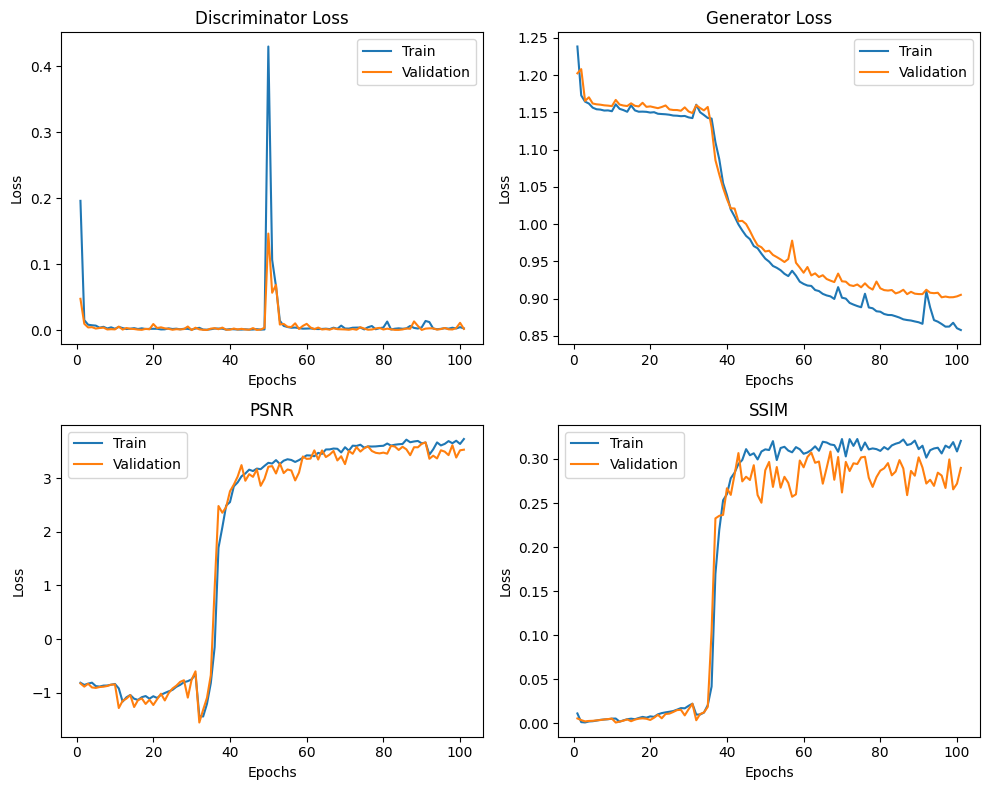

In [8]:
# Plot loss curves
plt.figure(figsize=(10, 8))

# Plot training and validation loss for Discriminator
plt.subplot(2, 2, 1)
plt.plot(range(1, len(stat_train['D_loss']) + 1), stat_train['D_loss'], label='Train')
plt.plot(range(1, len(stat_train['val_D_loss']) + 1), stat_train['val_D_loss'], label='Validation')
plt.title('Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation loss for Generator
plt.subplot(2, 2, 2)
plt.plot(range(1, len(stat_train['G_loss']) + 1), stat_train['G_loss'], label='Train')
plt.plot(range(1, len(stat_train['val_G_loss']) + 1), stat_train['val_G_loss'], label='Validation')
plt.title('Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(range(1, len(stat_train['D_loss']) + 1), stat_train['train_psnr'], label='Train')
plt.plot(range(1, len(stat_train['val_D_loss']) + 1), stat_train['val_psnr'], label='Validation')
plt.title('PSNR')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(range(1, len(stat_train['G_loss']) + 1), stat_train['train_ssim'], label='Train')
plt.plot(range(1, len(stat_train['val_G_loss']) + 1), stat_train['val_ssim'], label='Validation')
plt.title('SSIM')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [9]:
os.makedirs("test_images", exist_ok=True)
test_filenames = []
for root, dirs, files in os.walk(IMG_TEST_PATH):
    for name in files:
        test_filenames.append(os.path.join(root, name))
print(len(test_filenames))

300


In [10]:
class TestDataset(Dataset):
    def __init__(self, filename_list, hr_shape):
        hr_height, hr_width = hr_shape
        # Transforms for low resolution images and high resolution images
        self.transform = transforms.Compose([transforms.Resize((hr_height//4, hr_height//4), Image.BICUBIC),
                                             transforms.ToTensor(),
                                             transforms.Normalize(mean, std),
                                             ])
        self.files = filename_list

    def __getitem__(self, index):
        img = Image.open(self.files[index % len(self.files)])
        if img.mode != 'RGB':
            img = img.convert('RGB')
        return self.transform(img)

    def __len__(self):
        return len(self.files)
    
test_dataloader = DataLoader(TestDataset(test_filenames, hr_shape=hr_shape),
                             batch_size=1,
                             shuffle=False,  # No need to shuffle for testing
                             num_workers=opt.n_cpu)

In [11]:
# D_loss_test = 0
# G_loss_test = 0

# for i, img in enumerate(test_dataloader):
#     # Configure model input
#     imgs_lr = img.to(device)

#     optimizer_G.zero_grad()

#     # Generate a high resolution image from low resolution input
#     gen_hr = generator(imgs_lr)

#     # Save image grid with upsampled inputs and SRGAN outputs
#     imgs_lr = nn.functional.interpolate(imgs_lr, scale_factor=4)
#     gen_hr = make_grid(gen_hr, nrow=1, normalize=True)
#     imgs_lr = make_grid(imgs_lr, nrow=1, normalize=True)
#     img_grid = torch.cat((imgs_lr, gen_hr), -1)
#     save_image(img_grid, f"test_images/{i}.png", normalize=False)


# test_images_filenames = []
# for root, dirs, files in os.walk('./test_images'):
#     for name in files:
#         test_images_filenames.append(os.path.join(root, name))
        
    
# Move models and data to GPU if available
if cuda:
    generator = generator.cuda()
    generator = generator.to(device)  # Move generator parameters to CUDA device
    discriminator = discriminator.cuda()
    feature_extractor = feature_extractor.cuda()
    criterion_GAN = criterion_GAN.cuda()
    criterion_content = criterion_content.cuda()
    generator = torch.nn.DataParallel(generator)
    discriminator = torch.nn.DataParallel(discriminator)
    feature_extractor = torch.nn.DataParallel(feature_extractor)

# Define Tensor type based on GPU availability
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test loop
D_loss_test = 0
G_loss_test = 0

for i, img in enumerate(test_dataloader):
    # Configure model input
    imgs_lr = img.to(device)

    optimizer_G.zero_grad()

    # Generate a high resolution image from low resolution input
    gen_hr = generator(imgs_lr)

    # Save image grid with upsampled inputs and SRGAN outputs
    imgs_lr = nn.functional.interpolate(imgs_lr, scale_factor=4)
    gen_hr = make_grid(gen_hr, nrow=1, normalize=True)
    imgs_lr = make_grid(imgs_lr, nrow=1, normalize=True)
    img_grid = torch.cat((imgs_lr, gen_hr), -1)
    save_image(img_grid, f"test_images/{i}.png", normalize=False)

# Collect filenames of the saved test images
test_images_filenames = []
for root, dirs, files in os.walk('./test_images'):
    for name in files:
        test_images_filenames.append(os.path.join(root, name))


In [12]:
test_psnr = 0
test_ssim = 0

for i, img in enumerate(test_dataloader):
    # Configure model input
    imgs_lr = img.to(device)

    # Generate a high resolution image from low resolution input
    gen_hr = generator(imgs_lr)

    # Resize the generated HR image to match the ground truth HR image size
    gen_hr_resized = nn.functional.interpolate(gen_hr, size=(imgs_lr.size(2), imgs_lr.size(3)), mode='bicubic', align_corners=False)

    # Convert to numpy arrays
    gen_hr_np = gen_hr_resized.squeeze().detach().cpu().numpy()
    imgs_hr_np = img.squeeze().detach().cpu().numpy()

    # Calculate PSNR and SSIM    
    psnr = peak_signal_noise_ratio(imgs_hr_val, val_gen_hr, data_range=1.0)
    ssim = structural_similarity(imgs_hr_val, val_gen_hr, win_size=min(imgs_hr_val.shape[1], imgs_hr_val.shape[2], 11), data_range=1.0, multichannel=True)
            
    
    test_psnr += psnr
    test_ssim += ssim


test_psnr /= len(test_dataloader)
test_ssim /= len(test_dataloader)

print(f"Test PSNR: {test_psnr}")
print(f"Test SSIM: {test_ssim}")

Test PSNR: 2.7504967618866325
Test SSIM: 0.07191128515661555


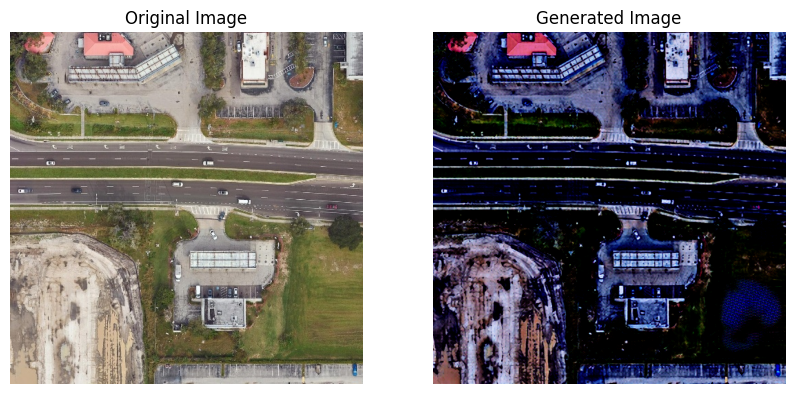

In [13]:
import matplotlib.pyplot as plt

# Choose an index of the image from the test set
index = 10  # You can change this index to visualize different images from the test set

# Load the selected image from the test set
test_image = Image.open(test_filenames[index]).convert('RGB')

# Transform the image to match the requirements of your model
transform = transforms.Compose([
    transforms.Resize((opt.hr_height, opt.hr_width), Image.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])
input_image = transform(test_image).unsqueeze(0).to(device)

# Generate the high-resolution image from the low-resolution input using the generator
with torch.no_grad():
    generated_image = generator(input_image).cpu().squeeze(0)
    generated_image = generated_image.permute(1, 2, 0).numpy()  # Change tensor shape for plotting

# Plot the original and generated images side by side
plt.figure(figsize=(10, 5))

# Original (low-resolution) image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(test_image)
plt.axis('off')

# Generated (high-resolution) image
plt.subplot(1, 2, 2)
plt.title('Generated Image')
plt.imshow(generated_image)
plt.axis('off')

plt.show()


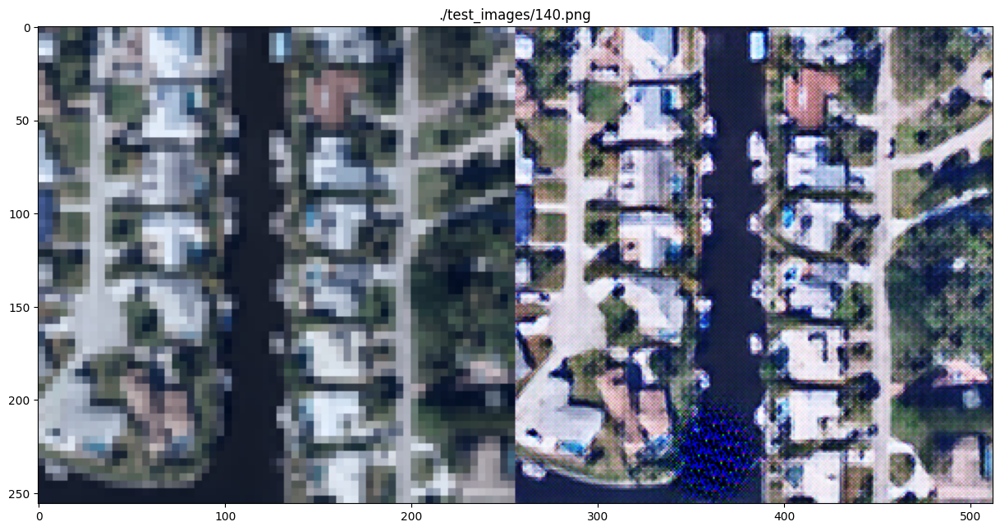

In [14]:
random_img_index = random.randint(0, len(test_images_filenames))
img_test = Image.open(test_images_filenames[random_img_index])

fig = plt.figure(figsize=(15, 15))
    
a = fig.add_subplot(1, 1, 1)
a.set_title(test_images_filenames[random_img_index])
imgplot = plt.imshow(img_test)

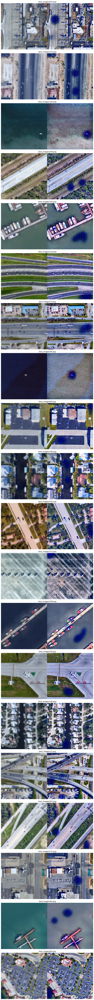

In [15]:
import random
import matplotlib.pyplot as plt

# Define the number of images to plot
num_images = 20

# Define the figure size (width, height) in inches
fig_width = 25
fig_height = 100  # Adjust the height as needed to accommodate the larger figures

# Create a figure and axis objects
fig, axes = plt.subplots(nrows=num_images, figsize=(fig_width, fig_height))

for i in range(num_images):
    # Randomly select an image index
    random_img_index = random.randint(0, len(test_images_filenames) - 1)
    
    # Open the image
    img_test = Image.open(test_images_filenames[random_img_index])
    
    # Plot the image
    axes[i].imshow(img_test)
    axes[i].set_title(test_images_filenames[random_img_index])
    axes[i].axis('off')

plt.tight_layout()
plt.show()
